<div class="alert alert-block alert-info">
<center><h1>Slow Style Transfer Training Sample</h1></center>
<h3><center>-- by <i>Socillay Dead Team</i></center></h3>
</div>

#### Notice: This is the re-training file for people to gain an overview of how we train the model proposed by Gatys. <p>

The style and content images we used are **different** from the ones in demonstration file and we used different directories. The style/content/ouput directories on the Github store all images for demonstration rather than this retraining file. If you want to re-run this file, please make new directory and add the images correspondingly.

#### Style images are: 
- sunflowers 
- starry_night
- armchair
- antique<p>
They are available at [wikiart](https://www.wikiart.org/en/vincent-van-gogh)

#### Content images are 
- four landscape images from FLickr <p>
They are available at [FLickr](https://www.flickr.com/groups/landcape)

### 1. Experiment Preparation
### 1.1 Import Modules

In [1]:
import os
import time
import sys
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from SlowStyleTransfer.utils import *
from mpl_toolkits.axes_grid1.inset_locator import inset_axes


### 1.2 Set up the directories

In [2]:
style_dir = "SlowStyleTransfer/s" # the folder / directory storing the style images
content_dir = "SlowStyleTransfer/c" # the folder / directory storing the content images
output_dir = "SlowStyleTransfer/o" # the folder / directory storing the output images
pth = "SlowStyleTransfer/saved_model" # the folder / directory storing the trained models

### 2 Train the model based on all style targets contained in the <I>style_dir</I>

In [3]:
for fn in os.listdir(style_dir):
    if fn == ".ipynb_checkpoints": continue
    style_name = fn.split(".")[0]
    style_img = os.path.join(style_dir,fn)
    print("-------------------- Style: {0} ------------------".format(style_name))
    train_flag = True
    
    for filename in os.listdir(content_dir):
        if filename == ".ipynb_checkpoints": continue
        content_name = filename.split(".")[0]
        sst = tic()
        
        opt_dir = output_dir + "/{0}/demo_{1}".format(style_name,filename)
        content_img = os.path.join(content_dir,filename) 
        
        # if the model corresponding to this style has not been built, trian
        if train_flag:
            !python SlowStyleTransfer/slow_style_main.py sst --style_image $style_img \
                                --content_image $content_img --output_image $opt_dir --style_weight $32000\
                                --print_freq $100 --checkpoint_path $pth
            train_flag = False
        
        # if there is a model, load th model
        else:
            saved_model = pth + "/{0}/{0}_checkpoint.pth.tar".format(style_name)
            !python SlowStyleTransfer/slow_style_main.py sst --style_image $style_img \
                            --content_image $content_img --output_image $opt_dir \
                            --print_freq $100 --checkpoint_path $pth --saved_model $saved_model --epochs $100
        toc(sst, "Implementation of stylizing {}".format(content_name))

-------------------- Style: antique ------------------
1. Building Style Transfer Model

THCudaCheck FAIL file=/opt/conda/conda-bld/pytorch_1544174967633/work/aten/src/THC/THCGeneral.cpp line=405 error=11 : invalid argument
2. Start Optimization

	Epochs 1:
	Style Loss : 625.8481	Content Loss: 0.0000

	Epochs 100:
	Style Loss : 1.6293	Content Loss: 10.3139

Implementation of stylizing landscape1 took: 16.768215656280518 sec.

THCudaCheck FAIL file=/opt/conda/conda-bld/pytorch_1544174967633/work/aten/src/THC/THCGeneral.cpp line=405 error=11 : invalid argument
	Epochs 1:
	Style Loss : 5689.4360	Content Loss: 32.5147

	Epochs 100:
	Style Loss : 10.0230	Content Loss: 30.3558

Implementation of stylizing landscape2 took: 14.752298355102539 sec.

THCudaCheck FAIL file=/opt/conda/conda-bld/pytorch_1544174967633/work/aten/src/THC/THCGeneral.cpp line=405 error=11 : invalid argument
	Epochs 1:
	Style Loss : 6499.0991	Content Loss: 23.3945

	Epochs 100:
	Style Loss : 4.5611	Content Loss: 29.9973


### 3. Plot the results

In [21]:
def PlotStyle(style):
    """
    : to plot the 4 stylized landscape figures with the original style image aligned at the left-lower corner
    """
    outputs = {}
    for c in os.listdir(style_dir):
        if c == ".ipynb_checkpoints": continue
        s = c.split(".")[0]
        outputs[s] = output_dir + "/{0}/".format(s)
    
    plt.figure(figsize=(30,20))
    gs = GridSpec(20, 30)
    
    c = 0
    prefix = outputs[style.split(".")[0]]
    opts = [prefix + opt for opt in os.listdir(prefix)]
    plt.subplot(gs[0:10, c+5:c+15])
    im = Image.open(prefix + "demo_landscape1.jpg")
    im = im.resize((512,512))
    plt.imshow(im)
    plt.axis("off")
    plt.subplot(gs[0:10, c+15:c+25])
    im = Image.open(prefix + "demo_landscape2.jpg")
    im = im.resize((512,512))
    plt.imshow(im)
    plt.axis("off")
    ax = plt.subplot(gs[10:20, c+5:c+15])
    im = Image.open(prefix + "demo_landscape3.jpg")
    im = im.resize((512,512))
    plt.imshow(im)
    plt.axis("off")
    plt.subplot(gs[10:20, c+15:c+25])
    im = Image.open(prefix + "demo_landscape4.jpg")
    im = im.resize((512,512))
    plt.imshow(im)
    plt.axis("off")
    rect = [-0.9,-0.5,0.7,0.7]
    ax1 = add_subplot_axes(ax,rect)
    im = Image.open(style_dir + "/" + style)
    im = im.resize((256,256))
    ax1.imshow(im)
    plt.axis("off")
    c += 20
        
    plt.tight_layout()
    plt.savefig("result1.jpg")
    plt.show()

In [22]:
def add_subplot_axes(ax,rect,axisbg='w'):
    fig = plt.gcf()
    box = ax.get_position()
    width = box.width
    height = box.height
    inax_position  = ax.transAxes.transform(rect[0:2])
    transFigure = fig.transFigure.inverted()
    infig_position = transFigure.transform(inax_position)    
    x = infig_position[0]
    y = infig_position[1]
    width *= rect[2]
    height *= rect[3]  
    subax = fig.add_axes([x,y,width,height])
    x_labelsize = subax.get_xticklabels()[0].get_size()
    y_labelsize = subax.get_yticklabels()[0].get_size()
    subax.xaxis.set_tick_params(labelsize=x_labelsize)
    subax.yaxis.set_tick_params(labelsize=y_labelsize)
    return subax

/opt/conda/lib/python3.6/site-packages/matplotlib/figure.py:2366: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


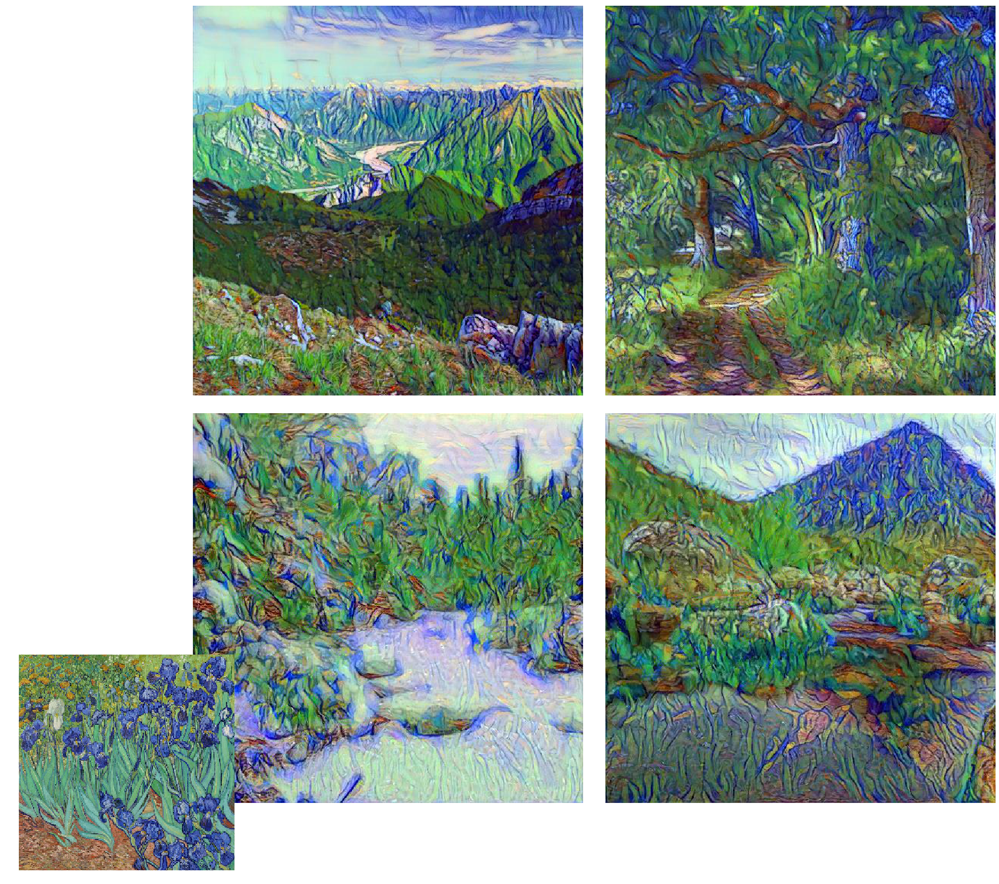

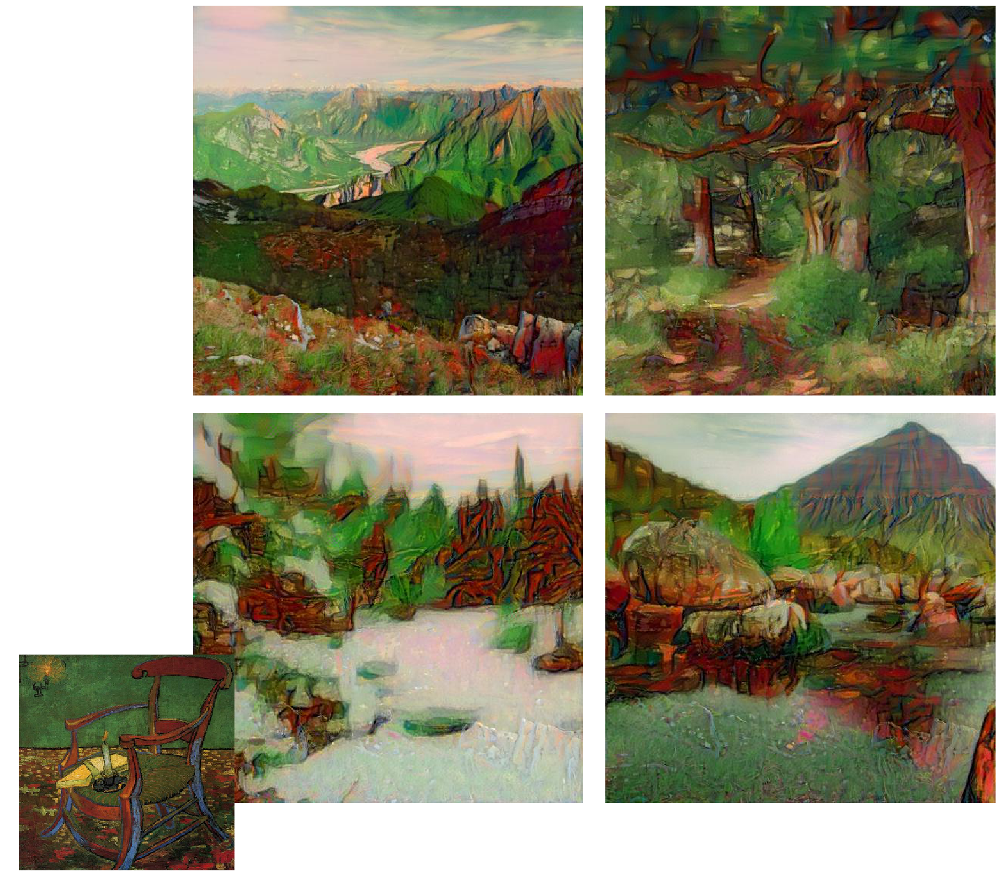

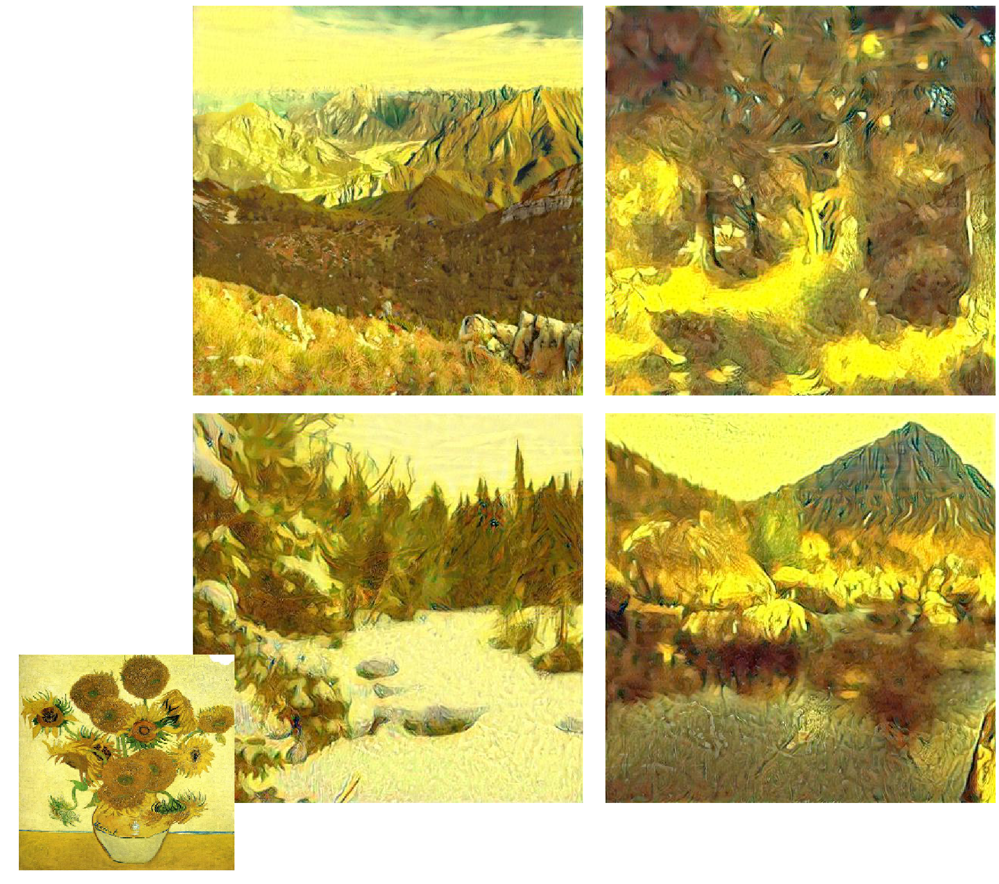

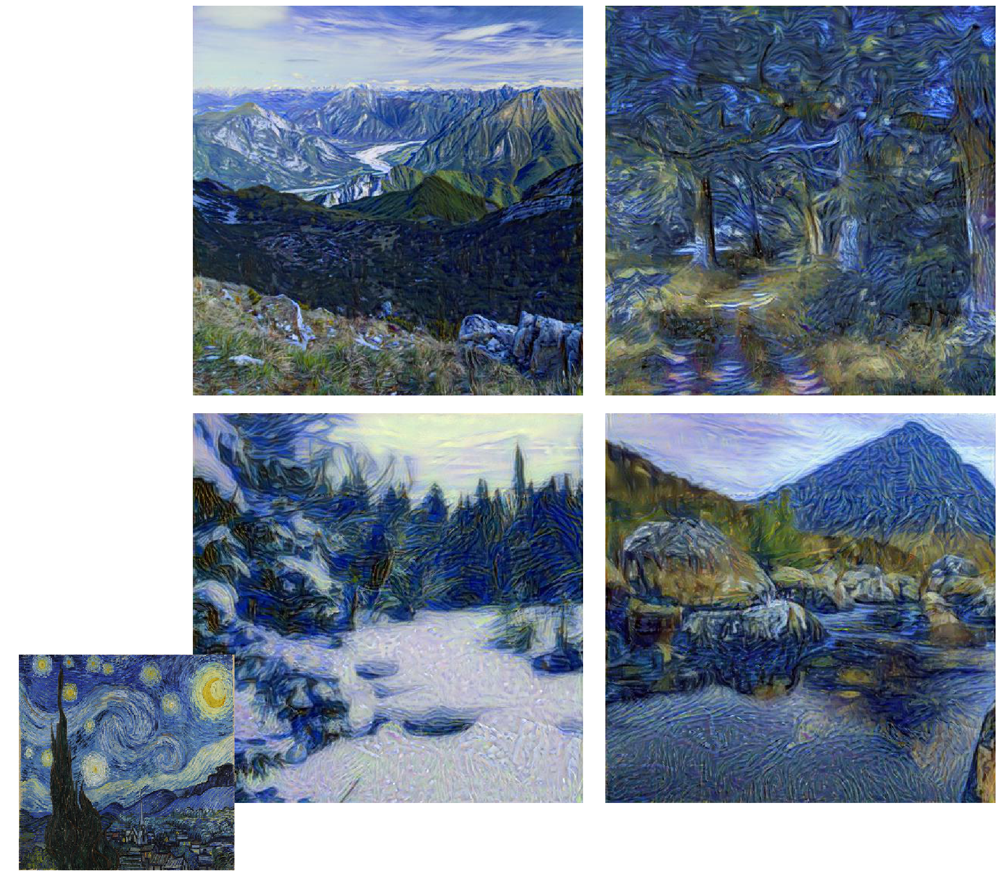

In [23]:
for style in os.listdir(style_dir):
    if style ==".ipynb_checkpoints": continue
    PlotStyle(style)